In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

In [2]:
#get the data
df = pd.read_csv('Placement_Data_Full_Class.csv')
df.shape

(215, 15)

In [3]:
df.head()

,sl_no,gender,ssc_p,ssc_b,hsc_p,hsc_b,hsc_s,degree_p,degree_t,workex,etest_p,specialisation,mba_p,status,salary
0,1,M,67.00,Others,91.00,Others,Commerce,58.00,Sci&Tech,No,55.0,Mkt&HR,58.80,Placed,270000.0
1,2,M,79.33,Central,78.33,Others,Science,77.48,Sci&Tech,Yes,86.5,Mkt&Fin,66.28,Placed,200000.0
2,3,M,65.00,Central,68.00,Central,Arts,64.00,Comm&Mgmt,No,75.0,Mkt&Fin,57.80,Placed,250000.0
3,4,M,56.00,Central,52.00,Central,Science,52.00,Sci&Tech,No,66.0,Mkt&HR,59.43,Not Placed,NaN
4,5,M,85.80,Central,73.60,Central,Commerce,73.30,Comm&Mgmt,No,96.8,Mkt&Fin,55.50,Placed,425000.0


#### Preprocessing

In [4]:
df.drop('salary',axis=1,inplace=True)

In [5]:
df['status'] = df['status'].apply(lambda x: 1 if x=='Placed' else 0)

In [6]:
df['status'].value_counts()

1    148
0     67
Name: status, dtype: int64

In [7]:
df.dtypes

sl_no               int64
gender             object
ssc_p             float64
ssc_b              object
hsc_p             float64
hsc_b              object
hsc_s              object
degree_p          float64
degree_t           object
workex             object
etest_p           float64
specialisation     object
mba_p             float64
status              int64
dtype: object

In [8]:
float_cols = [x for x in df.columns if df[x].dtype == 'float64']
object_cols = [x for x in df.columns if df[x].dtype == 'object']

In [9]:
float_cols

['ssc_p', 'hsc_p', 'degree_p', 'etest_p', 'mba_p']

In [10]:
object_cols

['gender', 'ssc_b', 'hsc_b', 'hsc_s', 'degree_t', 'workex', 'specialisation']

In [11]:
set(df.columns)-set(float_cols+object_cols)

{'sl_no', 'status'}

In [12]:
df[object_cols].nunique()

gender            2
ssc_b             2
hsc_b             2
hsc_s             3
degree_t          3
workex            2
specialisation    2
dtype: int64

#### Random forest

object columns need to be one hot encoded (drop_first = False is needed)

Couple of things to be kept in mind.

-  The columns after enocded shouldn't have any special characters other than '_'
-  The tree depth can be altered by the parameters of random forest depending on the data.
-  Data needs to have a primary key in order to extract the leaf data from the original data.

In [13]:
df_copy = df.copy(deep=True)
df_new = df.copy(deep=True)

In [14]:
for i in object_cols:
    s = pd.get_dummies(df_new[i],prefix=i,drop_first=False)
    df_new = pd.concat([df_new,s],axis=1)

In [15]:
df_new.drop(object_cols,axis=1,inplace=True)
df_new.head()

,sl_no,ssc_p,hsc_p,degree_p,etest_p,mba_p,status,gender_F,gender_M,ssc_b_Central,ssc_b_Others,hsc_b_Central,hsc_b_Others,hsc_s_Arts,hsc_s_Commerce,hsc_s_Science,degree_t_Comm&Mgmt,degree_t_Others,degree_t_Sci&Tech,workex_No,workex_Yes,specialisation_Mkt&Fin,specialisation_Mkt&HR
0,1,67.00,91.00,58.00,55.0,58.80,1,0,1,0,1,0,1,0,1,0,0,0,1,1,0,0,1
1,2,79.33,78.33,77.48,86.5,66.28,1,0,1,1,0,0,1,0,0,1,0,0,1,0,1,1,0
2,3,65.00,68.00,64.00,75.0,57.80,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,1,0
3,4,56.00,52.00,52.00,66.0,59.43,0,0,1,1,0,1,0,0,0,1,0,0,1,1,0,0,1
4,5,85.80,73.60,73.30,96.8,55.50,1,0,1,1,0,1,0,0,1,0,1,0,0,1,0,1,0


In [16]:
df_new.columns = [x.replace("&","_and_") for x in df_new.columns]

In [17]:
X = df_new.drop(['sl_no','status'],axis=1)
y = df_new['status']

In [18]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators = 5, min_samples_leaf = 20,random_state = 0,bootstrap=False)

In [19]:
clf.fit(X,y)

RandomForestClassifier(bootstrap=False, min_samples_leaf=20, n_estimators=5,
                       random_state=0)

#### All functions to get the desired tree format and also data and conditions from a chosen leaf

text_preprocess and info_box are related to the information you wish to display. I've included

-  Index of the node (which acts as a tracking number to the tree and can be used to extract the data in that node)
-  Size
-  % of the total data present in the node
-  target percentage (passed % in the node in this case)
-  % of all the positives present in the node.
-  Condition
-  left -> False
-  Right -> True

You can add any other information by editing these two functions accordingly

The output:

- conditions -> A dictionary with all the nodes as keys and conditions and final data summary as the value.
- data_dict -> A dictionary with all the nodes as keys and the corresponding data as the value

get_data takes the initial data, data_dict and the node index to give the data in the node

In [20]:
count = df.shape[0]
pos = df['status'].sum()
print(count,pos)

215 148


In [33]:
from sklearn.tree import export_graphviz
from subprocess import check_call
from IPython.display import Image
import re

In [34]:
def object_change(con):
    if 'gini = ' in con:
        return ''
    elif len([x for x in object_cols if x in con]) == 0:
        return con+'\n'
    else:
        var = [x for x in object_cols if x in con][0]
        if '<' in con:
            ind = [i for i, ltr in enumerate(con) if ltr == '<'][0]
            pre_text = con[:ind-1]
            ind = int([i for i,ltr in enumerate(pre_text) if ltr == '_'][-1])
            obj = pre_text[ind+1:]
            return str(var)+' !='+str(obj)+'\n'
        if '>' in con:
            ind = [i for i, ltr in enumerate(con) if ltr == '>'][0]
            pre_text = con[:ind-1]
            ind = [i for i, ltr in enumerate(pre_text) if ltr == '_'][-1]
            obj = pre_text[ind+1:]
            return str(var)+' ='+str(obj)+'\n'

In [35]:
def reverse(cond):
    r_dict = {'!':'=','<=':'>','>=':'<','=':'!='}
    log = [x for x in r_dict.keys() if x in cond][0]
    return cond.replace(log, r_dict[log])

In [36]:
def text_preprocess(s):
    val = int(re.findall(r'\d+',s)[0])
    check = re.search(r'label="(.*)\n',s)
    cond = check.group(1)
    text = re.compile(r'\w+\s\D+\s[+-]?([0-9]*[.])?[0-9]+')
    cond = text.search(cond).group()
    cond = object_change(cond)
    num = re.findall(r'\d+',s)[0]
    check = re.search('samples = (.*)\\\n',s)
    sample = check.group(1)
    list_check = re.compile(r'\[\d+\,\s\d+\]')
    ini_list = list_check.search(s).group()
    class_0 = int(ini_list.strip('][').split(', ')[0])
    class_1 = int(ini_list.strip('][').split(', ')[1])
    sample = class_0 + class_1
    sample_percent = round(sample/count*100,2)
    placed = round(class_1/sample*100,2)
    placed_contri = round(class_1/pos*100,2)
    label = str(val)+'\nsamples : '+str(sample)+'\n% of population : '+str(sample_percent)+'%\nplaced : '+str(placed)+'%\npercent of placed : '+str(placed_contri)+'%\n'+str(cond)
    quotes = [i for i,ltr in enumerate(s) if ltr == '"']
    return s[0:quotes[0]+1]+label+s[quotes[1]:]

In [37]:
def info_box(s):
    val = int(re.findall(r'\d+',s)[0])
    check = re.search(r'label="(.*)\n',s)
    cond = check.group(1)
    text = re.compile(r'\w+\s\D+\s[+-]?([0-9]*[.])?[0-9]+')
    cond = text.search(cond).group()
    cond = object_change(cond)
    num = re.findall(r'\d+',s)[0]
    check = re.search('samples = (.*)\\\n',s)
    sample = check.group(1)
    list_check = re.compile(r'\[\d+\,\s\d+\]')
    ini_list = list_check.search(s).group()
    class_0 = int(ini_list.strip('][').split(', ')[0])
    class_1 = int(ini_list.strip('][').split(', ')[1])
    sample = class_0 + class_1
    sample_percent = round(sample/count*100,2)
    placed = round(class_1/sample*100,2)
    placed_contri = round(class_1/pos*100,2)
    label = '\nsamples : '+str(sample)+'\n% of population : '+str(sample_percent)+'%\nplaced : '+str(placed)+'%\npercent of placed : '+str(placed_contri)+'%\n'+str(cond)
    quotes = [i for i,ltr in enumerate(s) if ltr == '"']
    return label

In [38]:
def print_tree(clf,df):
    dotfile = open('tree.dot','w')
    export_graphviz(clf, out_file=dotfile,feature_names = X.columns,class_names=True,rounded=True,proportion=False,
                   precision = 2, filled = True)
    dotfile.close()
    f = open("tree.dot","r")
    f1 = open("tree_new.dot",'w')
    dictionary ={}
    for x in f:
        check = re.compile(r'^\d+\s->')
        if check.search(x):
            els = re.findall(r'\d+',x)[0:2]
            try:
                dictionary[int(els[0])].append(int(els[1]))
            except:
                dictionary[int(els[0])] = [int(els[1])]
    data_dict = {}
    conditions = {}
    data_dict[0] = df_new
    conditions[0] = ''
    f = open("tree.dot","r")
    for x in f:
        check = re.compile(r'^\d+\s\[')
        if check.search(x):
            val = int(re.findall(r'\d+',x)[0])
            check = re.search(r'label="(.*)\n',x)
            cond = check.group(1)
            text = re.compile(r'^\w+\s\D+\s[+-]?([0-9]*[.])?[0-9]+')
            cond = text.search(cond).group()
            X_df = data_dict[val]
            if 'gini' not in cond:
                X_df = pd.eval('cond = X_df.'+cond, target = X_df)
                data_dict[dictionary[val][0]] = X_df[X_df['cond'] == True]
                conditions[dictionary[val][0]] = conditions[val]+'&'+object_change(cond)
                data_dict[dictionary[val][1]] = X_df[X_df['cond'] == False]
                conditions[dictionary[val][1]] = conditions[val]+'&'+reverse(object_change(cond))
    check = re.compile(r'^\d+\s\[')
    f = open("tree.dot", 'r')
    for x in f:
        if check.search(x):
            f1.write(text_preprocess(x))
            val = int(re.findall(r'\d+',x)[0])
            conditions[val] = conditions[val]+info_box(x)
        else:
            f1.write(x)
    f1.close()
    !dot -Tpng tree_new.dot -o tree_a.png -Gdpi=600
    display(Image(filename = 'tree_a.png'))
    return conditions,data_dict

In [39]:
def get_data(dicts,df,num):
    return df[df['sl_no'].isin(list(dicts[num]['sl_no'].unique()))]

### Tree_0

In [40]:
conds,dicts = print_tree(clf.estimators_[0],df_new)

In [41]:
#node_index = 8
print(conds[8][1:])
sub_df = get_data(dicts,df_copy,8)

workex ==No
&specialisation !=Fin
&etest_p > 59.66
&hsc_p <= 62.92

samples : 28
% of population : 13.02%
placed : 14.29%
percent of placed : 2.7%



In [42]:
sub_df.head()

,sl_no,gender,ssc_p,ssc_b,hsc_p,hsc_b,hsc_s,degree_p,degree_t,workex,etest_p,specialisation,mba_p,status
3,4,M,56.0,Central,52.0,Central,Science,52.0,Sci&Tech,No,66.00,Mkt&HR,59.43,0
12,13,F,47.0,Central,55.0,Others,Science,65.0,Comm&Mgmt,No,62.00,Mkt&HR,65.04,0
14,15,M,62.0,Central,47.0,Central,Commerce,50.0,Comm&Mgmt,No,76.00,Mkt&HR,54.96,0
31,32,F,67.0,Central,53.0,Central,Science,65.0,Sci&Tech,No,64.00,Mkt&HR,58.32,0
34,35,M,62.0,Others,51.0,Others,Science,52.0,Others,No,68.44,Mkt&HR,62.77,0


In [43]:
#node_index = 2
print(conds[2][1:])
sub_df = get_data(dicts,df_copy,2)

workex !=No
&specialisation !=HR

samples : 51
% of population : 23.72%
placed : 92.16%
percent of placed : 31.76%



In [44]:
sub_df.shape

(51, 14)

### Tree_1

In [45]:
conds,dicts = print_tree(clf.estimators_[1],df_new)

In [46]:
#node_index = 11
print(conds[11][1:])
sub_df = get_data(dicts,df_copy,11)

etest_p <= 79.5
&specialisation ==Fin
&degree_p > 64.13
&hsc_p > 66.6

samples : 22
% of population : 10.23%
placed : 100.0%
percent of placed : 14.86%



In [47]:
sub_df.head()

,sl_no,gender,ssc_p,ssc_b,hsc_p,hsc_b,hsc_s,degree_p,degree_t,workex,etest_p,specialisation,mba_p,status
11,12,M,69.60,Central,68.4,Central,Commerce,78.3,Comm&Mgmt,Yes,60.00,Mkt&Fin,63.70,1
15,16,F,65.00,Central,75.0,Central,Commerce,69.0,Comm&Mgmt,Yes,72.00,Mkt&Fin,64.66,1
19,20,M,60.00,Others,67.0,Others,Arts,70.0,Comm&Mgmt,Yes,50.48,Mkt&Fin,77.89,1
28,29,M,76.76,Others,76.5,Others,Commerce,67.5,Comm&Mgmt,Yes,73.35,Mkt&Fin,64.15,1
40,41,F,78.00,Central,77.0,Others,Commerce,80.0,Comm&Mgmt,No,60.00,Mkt&Fin,66.72,1


In [48]:
#node_index = 4
print(conds[4][1:])
sub_df = get_data(dicts,df_copy,4)

etest_p <= 79.5
&specialisation !=Fin
&degree_p <= 65.8
&hsc_p <= 60.67

samples : 20
% of population : 9.3%
placed : 5.0%
percent of placed : 0.68%



In [49]:
sub_df.shape

(20, 14)

### Tree_2

In [50]:
conds,dicts = print_tree(clf.estimators_[2],df_new)

In [51]:
#node_index = 13
print(conds[13][1:])
sub_df = get_data(dicts,df_copy,13)

workex ==No
&degree_p > 65.8
&gender !=F

samples : 36
% of population : 16.74%
placed : 97.22%
percent of placed : 23.65%



In [52]:
sub_df.head()

,sl_no,gender,ssc_p,ssc_b,hsc_p,hsc_b,hsc_s,degree_p,degree_t,workex,etest_p,specialisation,mba_p,status
4,5,M,85.8,Central,73.6,Central,Commerce,73.30,Comm&Mgmt,No,96.80,Mkt&Fin,55.50,1
8,9,M,73.0,Central,79.0,Central,Commerce,72.00,Comm&Mgmt,No,91.34,Mkt&Fin,61.29,1
20,21,M,62.0,Others,65.0,Others,Commerce,66.00,Comm&Mgmt,No,50.00,Mkt&HR,56.70,1
24,25,M,76.5,Others,97.7,Others,Science,78.86,Sci&Tech,No,97.40,Mkt&Fin,74.01,1
27,28,M,63.0,Others,67.0,Others,Commerce,66.00,Comm&Mgmt,No,68.00,Mkt&HR,57.69,1


In [53]:
#node_index = 8
print(conds[8][1:])
sub_df = get_data(dicts,df_copy,8)

workex ==No
&degree_p <= 65.8
&hsc_p <= 57.5

samples : 23
% of population : 10.7%
placed : 0.0%
percent of placed : 0.0%



In [54]:
sub_df.shape

(23, 14)

### Tree_3

In [55]:
conds,dicts = print_tree(clf.estimators_[3],df_new)

In [56]:
#node_index = 4
print(conds[4][1:])
sub_df = get_data(dicts,df_copy,4)

degree_p <= 64.24
&mba_p > 58.37
&ssc_p <= 61.54

samples : 27
% of population : 12.56%
placed : 3.7%
percent of placed : 0.68%



In [57]:
sub_df.head()

,sl_no,gender,ssc_p,ssc_b,hsc_p,hsc_b,hsc_s,degree_p,degree_t,workex,etest_p,specialisation,mba_p,status
3,4,M,56.00,Central,52.00,Central,Science,52.0,Sci&Tech,No,66.0,Mkt&HR,59.43,0
10,11,M,58.00,Central,61.00,Central,Commerce,60.0,Comm&Mgmt,Yes,62.0,Mkt&HR,60.85,1
17,18,F,55.00,Central,67.00,Central,Commerce,64.0,Comm&Mgmt,No,60.0,Mkt&Fin,67.28,0
25,26,F,52.58,Others,54.60,Central,Commerce,50.2,Comm&Mgmt,Yes,76.0,Mkt&Fin,65.33,0
51,52,M,54.40,Central,61.12,Central,Commerce,56.2,Comm&Mgmt,No,67.0,Mkt&HR,62.65,0


In [58]:
#node_index = 9
print(conds[9][1:])
sub_df = get_data(dicts,df_copy,9)

degree_p > 64.24
&ssc_b !=Central
&etest_p > 68.35

samples : 38
% of population : 17.67%
placed : 94.74%
percent of placed : 24.32%



In [59]:
sub_df.shape

(38, 14)

### Tree_4

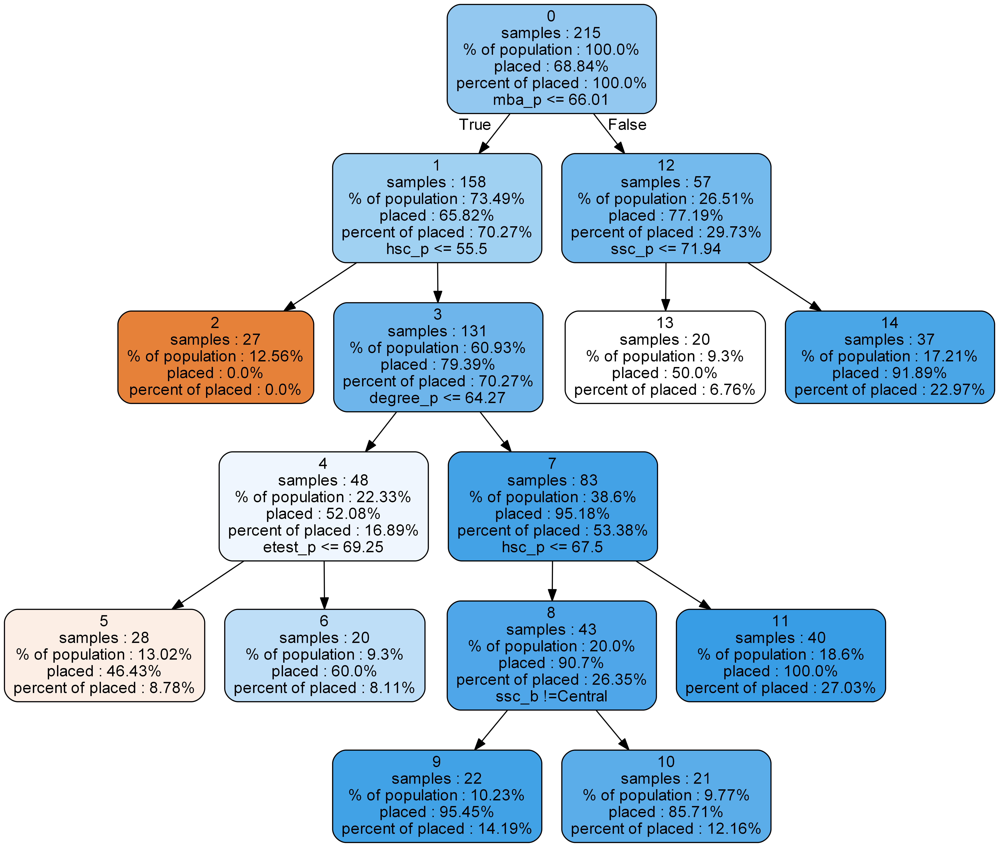

In [60]:
conds,dicts = print_tree(clf.estimators_[4],df_new)

In [61]:
#node_index = 2
print(conds[2][1:])
sub_df = get_data(dicts,df_copy,2)

mba_p <= 66.01
&hsc_p <= 55.5

samples : 27
% of population : 12.56%
placed : 0.0%
percent of placed : 0.0%



In [62]:
sub_df.head()

,sl_no,gender,ssc_p,ssc_b,hsc_p,hsc_b,hsc_s,degree_p,degree_t,workex,etest_p,specialisation,mba_p,status
3,4,M,56.0,Central,52.0,Central,Science,52.00,Sci&Tech,No,66.00,Mkt&HR,59.43,0
5,6,M,55.0,Others,49.8,Others,Science,67.25,Sci&Tech,Yes,55.00,Mkt&Fin,51.58,0
6,7,F,46.0,Others,49.2,Others,Commerce,79.00,Comm&Mgmt,No,74.28,Mkt&Fin,53.29,0
12,13,F,47.0,Central,55.0,Others,Science,65.00,Comm&Mgmt,No,62.00,Mkt&HR,65.04,0
14,15,M,62.0,Central,47.0,Central,Commerce,50.00,Comm&Mgmt,No,76.00,Mkt&HR,54.96,0


In [63]:
#node_index = 7
print(conds[7][1:])
sub_df = get_data(dicts,df_copy,7)

mba_p <= 66.01
&hsc_p > 55.5
&degree_p > 64.27

samples : 83
% of population : 38.6%
placed : 95.18%
percent of placed : 53.38%
hsc_p <= 67.5



In [64]:
sub_df.shape

(83, 14)